In [2]:
library(io)
library(ggplot2)
library(arrow)
source("../../common-ffpe-snvf/R/macni_somatic.R")
# library(vcfR)
# library(tidyr)
library(ggpubr)
# library(dplyr)

In [4]:
#' Read a VCF into a data.frame
#'
#' @description
#' Read a VCF file using vcfR::read.vcfR and extract commonly used INFO/FORMAT
#' fields into a flat data.frame. Splits AD, F1R2 and F2R1 genotype fields into
#' reference and alternate counts, and computes VAF and orientation-bias score (SOB).
#' 
#' Limitation: Implemeted for VCF with just 1 sample.
#'
#' @param vcf_path (string) Path to the VCF file.
#' @param sample_name (string) Name to assign to the sample/column in the output.
#'
#' @return (data.frame) Columns:
#'   chrom, pos, ref, alt, filter,
#'   ad_ref, ad_alt,
#'   f1r2_ref, f1r2_alt,
#'   f2r1_ref, f2r1_alt,
#'   vaf, sob, sample_name
#'
#' @details
#' AD, F1R2 and F2R1 are expected as comma-separated genotype fields. If AD
#' contains more than two values, the second column will capture the merged
#' remainder (extra="merge"). SOB is computed as abs((F1R2_alt - F2R1_alt) / (F1R2_alt + F2R1_alt)).
#'
#' @examples
#' # read_vcf("sample.vcf", "sample1")
read_vcf <- function(vcf_path, sample_name=NULL){

	vcf0 <- read.vcfR(vcf_path, verbose = FALSE)
	vcf1 <- data.frame(
		chrom = getCHROM(vcf0),
		pos = getPOS(vcf0),
		ref = getREF(vcf0),
		alt = getALT(vcf0),
		filter = getFILTER(vcf0),
		ad = as.vector(extract.gt(vcf0, element = "AD")),
		f1r1 = as.vector(extract.gt(vcf0, element = "F1R2")),
		f2r1 = as.vector(extract.gt(vcf0, element = "F2R1"))
	)

	vcf1 <- separate(vcf1, ad, into = c("ad_ref", "ad_alt"), sep=",", extra="merge", convert = TRUE)
	vcf1 <- separate(vcf1, f1r1, into = c("f1r2_ref", "f1r2_alt"), sep=",", extra="merge", convert = TRUE)
	vcf1 <- separate(vcf1, f2r1, into = c("f2r1_ref", "f2r1_alt"), sep=",", extra="merge", convert = TRUE)

	# Split multiallelic sites to biallelic
	vcf1 <- separate_rows(vcf1, alt, ad_alt, f1r2_alt, f2r1_alt, sep = ",")

	# Ensure columns numeric columns are numeric
	vcf1 <- mutate(
		vcf1,
		ad_ref = as.numeric(ad_ref),
		ad_alt = as.numeric(ad_alt),
		f1r2_ref = as.numeric(f1r2_ref),
		f1r2_alt = as.numeric(f1r2_alt),
		f2r1_ref = as.numeric(f2r1_ref),
		f2r1_alt = as.numeric(f2r1_alt)
	)

	vcf1$vaf <- with(vcf1, ad_alt/(ad_ref + ad_alt))
	vcf1$sob <- with(vcf1, abs((f1r2_alt - f2r1_alt)/(f1r2_alt + f2r1_alt)))

	# # Some variants may have a SOB score of NaN as both F1R2_alt and F2R1_alt are 0.
	# # This is likey due to the variant being called from reads with missing mates
	# vcf1$sob <- with(vcf1, ifelse(is.nan(sob), 0, sob))

	if (!is.null(sample_name)){
		vcf1$sample_name <- sample_name
	}

	return(vcf1)

}

In [5]:
#' Extract Allelic Depth (count of reads supporting ref and alt allele)
#' @param vcf (data.frame) VCF read using qread from io package.
#' @param sample_name (string) name of tumor sample name in the VCF.
#' @param tresh (float) posterior probability threshold above which 
#' the varaint is to be considerd somatic.
#' @return (data.frame) variants with macni posterior probability annotated.
#' columns:  [chrom, pos, ref, alt, ad_ref, ad_alt, "macni_pp", "is_somatic"]
run_macni <- function(vcf, sample_name, thresh=0.5, alpha.ghomo = 100, alpha.ghet = 100, beta.ghomo = 0, beta.ghet = 100) {

	if (!"vaf" %in% tolower(names(vcf))){
		data <- extract_ad(vcf, sample_name, annotate_vaf=TRUE)
	} else {
		data <- vcf
	}

	alpha <- data.frame(
		ghomo = rep(alpha.ghomo, times = nrow(data)), 
		ghet = rep(alpha.ghet, times = nrow(data))
	)

	beta <- data.frame(
		ghomo = rep(beta.ghomo, times = nrow(data)), 
		ghet = rep(beta.ghet, times = nrow(data))
	)

	data$macni_pp <- somatic_model(
		ac = data$ad_ref,
		bc = data$ad_alt,
		alpha = alpha,
		beta = beta,
		log = FALSE
	)

	data$is_somatic <- ifelse(data$macni_pp > thresh & !(is.nan(data$macni_pp) & data$vaf == 1), TRUE, FALSE)

	return(data)
}

In [3]:
#' Make per-sample VAF plots
#'
#' @description
#' Create histogram plots of variant allele frequency (or another numeric column)
#' facetted by sample. Plots are filled by the `is_somatic` flag and use free y-scales
#' per sample. The plot may be returned as a ggplot object or written to a file via qdraw.
#'
#' @param all_res (data.frame) Data frame containing at minimum: `sample_name`, `is_somatic`,
#'   and the column specified by `x_col` (default "vaf").
#' @param x_col (string) Name of the column to plot on the x-axis. Default: "vaf".
#' @param title (string|null) Plot title.
#' @param subtitle (string|null) Plot subtitle.
#' @param x_lab (string) Label for x-axis. Default: "Variant Allele Frequency".
#' @param y_lab (string) Label for y-axis. Default: "count".
#' @param file (string|null) If provided, path to save the plot using qdraw(). If NULL, the ggplot object is returned.
#' @param base_size (numeric) Base font size passed to theme_classic(). Default: 20.
#' @param bins (integer) Number of bins for geom_histogram(). Default: 50.
#'
#' @return (ggplot object) If `file` is NULL the ggplot object is returned. If `file` is provided,
#'   the plot is saved to disk and nothing is returned.
#'
make_hist_plot <- function(
		all_res, 
		x_col = "vaf", 
		title = NULL, 
		subtitle = NULL, 
		x_lab = "Variant Allele Frequency", 
		y_lab = "count",
		file = NULL,
		base_size = 20, 
		bins = 50,
		width = NULL,
		height = NULL
	){

	if(is.null(width) & is.null(height)){
		options(repr.plot.width = 20, repr.plot.height = floor(length(unique(all_res$sample_name))/1.5))
	} else {
		options(repr.plot.width = width, repr.plot.height = height)
	}

	macni_vaf_plot <- ggplot(all_res, aes(x = .data[[x_col]], fill = is_somatic)) +
		geom_histogram(bins = bins, color="black") +
		facet_wrap(~sample_name, ncol = 4, scales = "free_y") +
		theme_classic(base_size = base_size) +
		labs(
			title = title,
			subtitle = subtitle,
			x = x_lab,
			y = y_lab
		)

	if(!is.null(file)){
		qdraw(macni_vaf_plot, file, width = 20, height = floor(length(unique(all_res$sample_name))/1.5))
	} else {
		return(macni_vaf_plot)
	}
}

In [4]:
snv_filter <- function(df){
	return (df[(nchar(df$ref) == 1) & (nchar(df$alt) == 1 ),])
}

In [5]:
annotate_mut_type <- function(df){
	df$mut_type <- paste0(df$ref, ">", df$alt)
	return(df)
}

In [6]:
ct_mask <- function(df){
	((df$ref == "C") & (df$alt == "T")) | ((df$ref == "G") & (df$alt == "A"))
}

In [17]:
cannonicalize_mut_type <- function(df){	
	mutation_canonicalizer <- c(
		"C>A" = "C>A", "G>T" = "C>A",
		"C>G" = "C>G", "G>C" = "C>G",
		"C>T" = "C>T", "G>A" = "C>T",
		"T>A" = "T>A", "A>T" = "T>A",
		"T>C" = "T>C", "A>G" = "T>C",
		"T>G" = "T>G", "A>C" = "T>G"
	)
	rows_to_change <- df$mut_type %in% names(mutation_canonicalizer)
	df$mut_type[rows_to_change] <- mutation_canonicalizer[df$mut_type[rows_to_change]]
	return(df)
}

In [7]:
get_mut_type_count <- function(df){

	df_snv <- snv_filter(df)
	annotate_mut_type(df_snv)
	mut_type_count <- as.data.frame(table(df_snv$mut_type))
	names(mut_type_count) <- c("mut_type", "count")
	return(mut_type_count)

}

## ENA PRJEB44073 | Chong21

In [12]:
vcf_paths = Sys.glob("../../vcf/PRJEB44073/vcf_filtered_pass-orientation-dp10-blacklist/*/*.vcf")
ena_chong21 <- list()

for (i in seq_along(vcf_paths)){
	path <- vcf_paths[i]
	sample_name <- basename(dirname(path))
	message(sprintf("%s. Processing sample: %s", i, sample_name))

	vcf <- read_vcf(path, sample_name)
	res <- run_macni(vcf,  sample_name, thresh = 0.5)
	
	ena_chong21[[i]] <- res
}

ena_chong21 <- do.call(rbind, ena_chong21)
write_parquet(ena_chong21, file.path("ena_chong21_macni_ppcut-0.5_table.parquet"))

1. Processing sample: Sample_B83_0001



2. Processing sample: Sample_B83_0002

3. Processing sample: Sample_B83_0003

4. Processing sample: Sample_B83_0004

5. Processing sample: Sample_B83_0005

6. Processing sample: Sample_B83_0006

7. Processing sample: Sample_B83_0007

8. Processing sample: Sample_B83_0008

9. Processing sample: Sample_B83_0010

10. Processing sample: Sample_B83_0011

11. Processing sample: Sample_B83_0012

12. Processing sample: Sample_B83_0013

13. Processing sample: Sample_B83_0014

14. Processing sample: Sample_B83_0015

15. Processing sample: Sample_B83_0016

16. Processing sample: Sample_B83_0017

17. Processing sample: Sample_B83_0018

18. Processing sample: Sample_B83_0019

19. Processing sample: Sample_B83_0020

20. Processing sample: Sample_B83_0021

21. Processing sample: Sample_B83_0022

22. Processing sample: Sample_B83_0023

23. Processing sample: Sample_B83_0024

24. Processing sample: Sample_B83_0025

25. Processing sample: Sample_B83_0026

26. Processing sample: Sample_B83_0027

27. Proc

In [13]:
thresholds <- seq(0, 1, 0.1)

outdir = "vaf_plots"
dir.create(outdir, showWarnings = FALSE, recursive = TRUE)

for (thresh in thresholds){
	message("Making VAF plots using posterior probability cutoff theshold: ", thresh)

	ena_chong21$is_somatic <- ifelse(ena_chong21$macni_pp > thresh & !(is.nan(ena_chong21$macni_pp) & ena_chong21$vaf == 1), TRUE, FALSE)

	make_hist_plot(
		ena_chong21, 
		title = "ENA Chong21", 
		subtitle = sprintf("MACNI Posterior Probability threshold > %s", thresh),
		file = file.path(outdir, sprintf("ena_chong21_macni-%s_per-sample-vaf-plots.pdf", thresh))
	)
}

ena_chong21$is_somatic <- ifelse(ena_chong21$macni_pp > 0.5 & !(is.nan(ena_chong21$macni_pp) & ena_chong21$vaf == 1), TRUE, FALSE)

Making VAF plots using posterior probability cutoff theshold: 0



Making VAF plots using posterior probability cutoff theshold: 0.1

Making VAF plots using posterior probability cutoff theshold: 0.2

Making VAF plots using posterior probability cutoff theshold: 0.3

Making VAF plots using posterior probability cutoff theshold: 0.4

Making VAF plots using posterior probability cutoff theshold: 0.5

Making VAF plots using posterior probability cutoff theshold: 0.6

Making VAF plots using posterior probability cutoff theshold: 0.7

Making VAF plots using posterior probability cutoff theshold: 0.8

Making VAF plots using posterior probability cutoff theshold: 0.9

Making VAF plots using posterior probability cutoff theshold: 1



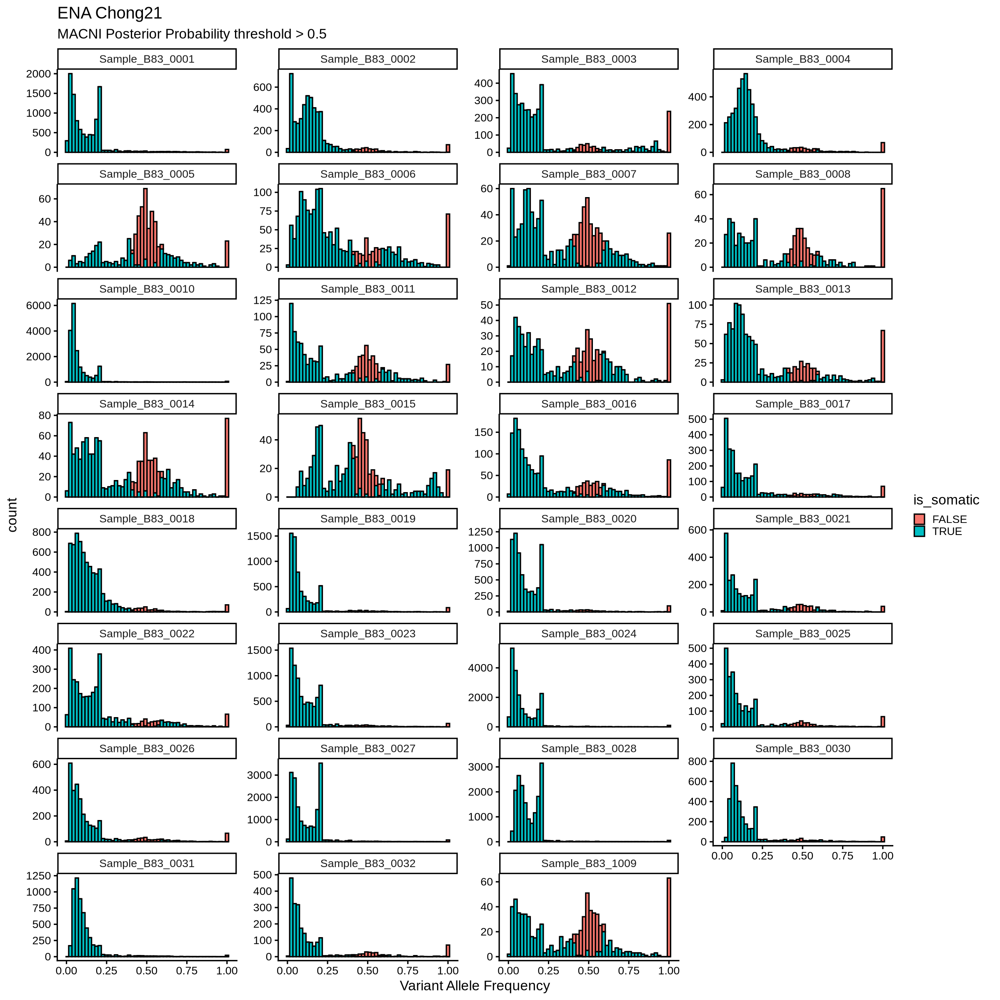

In [14]:
thresh <- 0.5
ena_chong21$is_somatic <- ifelse(ena_chong21$macni_pp > thresh & !(is.nan(ena_chong21$macni_pp) & ena_chong21$vaf == 1), TRUE, FALSE)	
make_hist_plot(
	ena_chong21, 
	title = "ENA Chong21", 
	subtitle = sprintf("MACNI Posterior Probability threshold > %s", thresh),
)

Warning message:
“Removed 1512 rows containing non-finite outside the scale range (`stat_bin()`).”


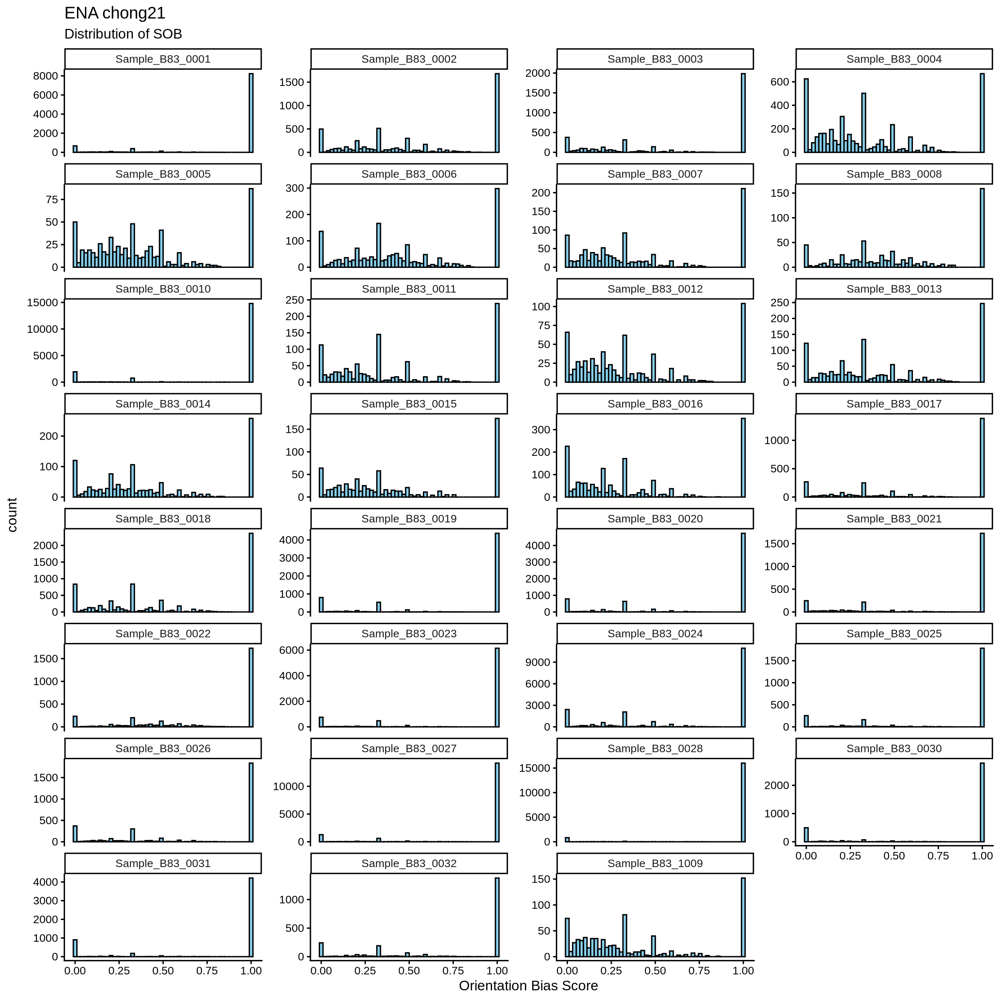

In [15]:
## Distribution of SOB
ggplot(ena_chong21, aes(x=sob)) +
	geom_histogram(color="black", bins = 50, fill="skyblue") +
	facet_wrap(~sample_name, ncol = 4, scales = "free_y") +
	theme_classic(base_size = 20) +
	labs(
		title = "ENA chong21",
		subtitle = "Distribution of SOB",
		x =  "Orientation Bias Score"
	)

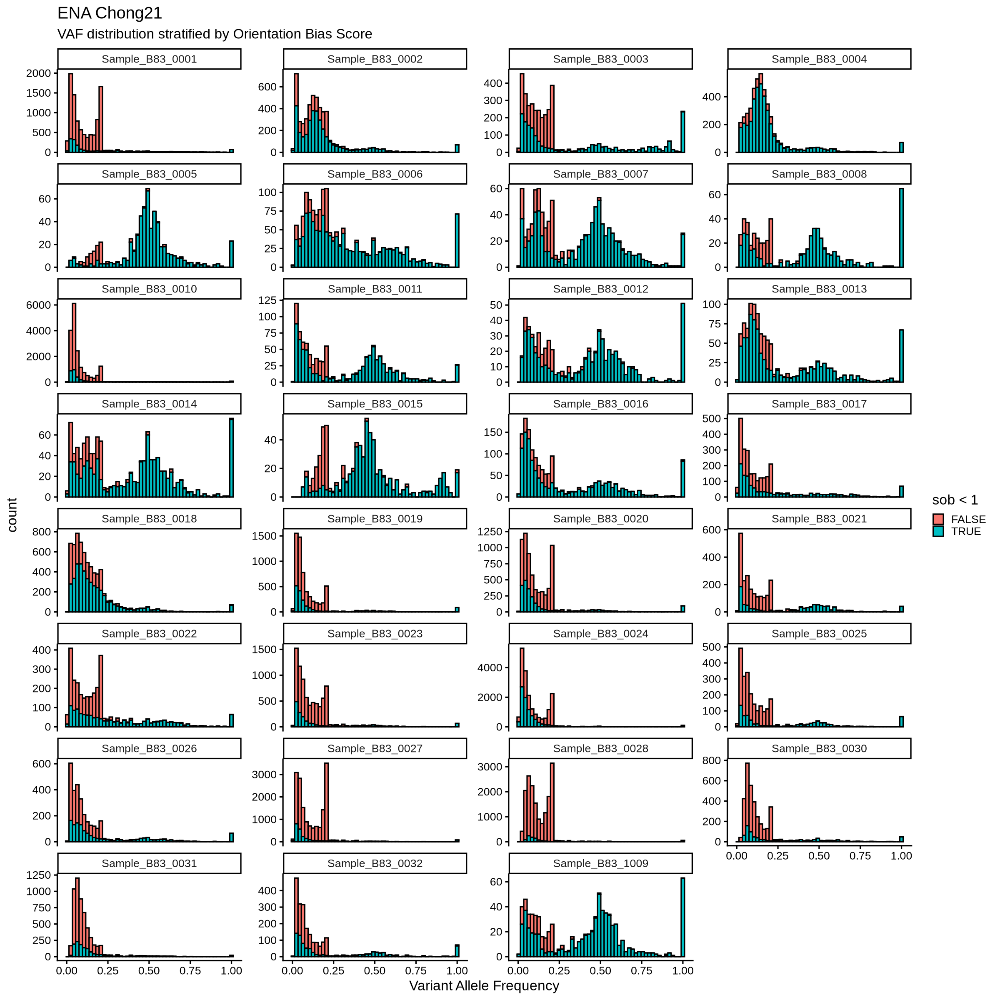

In [16]:
options(repr.plot.width = 20, repr.plot.height = floor(length(unique(ena_chong21$sample_name))/1.5))
ggplot(ena_chong21[!is.na(ena_chong21$sob),], aes(x = vaf, fill = sob<1)) +
	geom_histogram(bins = 50, color="black") +
	theme_classic(base_size = 20) +
	facet_wrap(~sample_name, ncol = 4, scales = "free_y") +
	labs(
		title = "ENA Chong21",
		subtitle = "VAF distribution stratified by Orientation Bias Score",
		x = "Variant Allele Frequency"
	)

`geom_smooth()` using formula = 'y ~ x'
Warning message:
“Removed 1512 rows containing non-finite outside the scale range
(`stat_smooth()`).”
Warning message:
“Removed 1512 rows containing non-finite outside the scale range (`stat_cor()`).”
Warning message:
“Removed 1512 rows containing missing values or values outside the scale range
(`geom_point()`).”


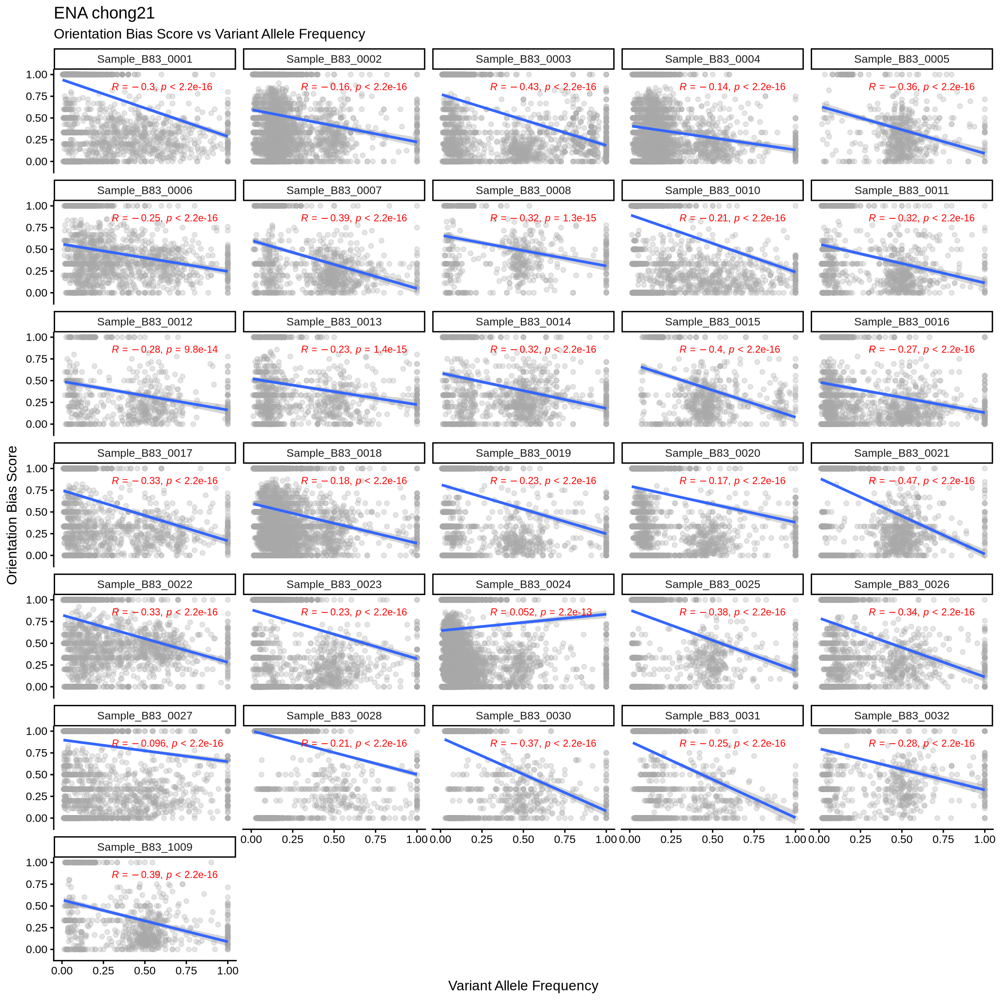

In [17]:
## Relationship between VAF and Orienation Bias Score
ggplot(ena_chong21, aes(x=vaf, y=sob)) +
	geom_point(alpha = 0.3, color="darkgrey") +
	geom_smooth(method = "lm") +
	stat_cor(method = "pearson", label.x = 0.3, label.y = 0.85, size = 5, color = "red", fontface = "bold") +
	facet_wrap(~sample_name, ncol = 5) +
	xlim(0, 1) +
	theme_classic(base_size = 20) +
	labs(
		title = "ENA chong21",
		subtitle = "Orientation Bias Score vs Variant Allele Frequency",
		x = "Variant Allele Frequency",
		y = "Orientation Bias Score"
	)

In [18]:
ena_chong21 <- read_parquet("ena_chong21_macni_ppcut-0.5_table.parquet")
annot <- read.delim("../../annot/PRJEB44073/sample-info_stage3.tsv")
annot <- annot[, c("sample_name", "preservation")]
ena_chong21_annot <- merge(snv_filter(ena_chong21), annot, by = "sample_name")
ena_chong21 <- cannonicalize_mut_type(annotate_mut_type(snv_filter(ena_chong21_annot)))

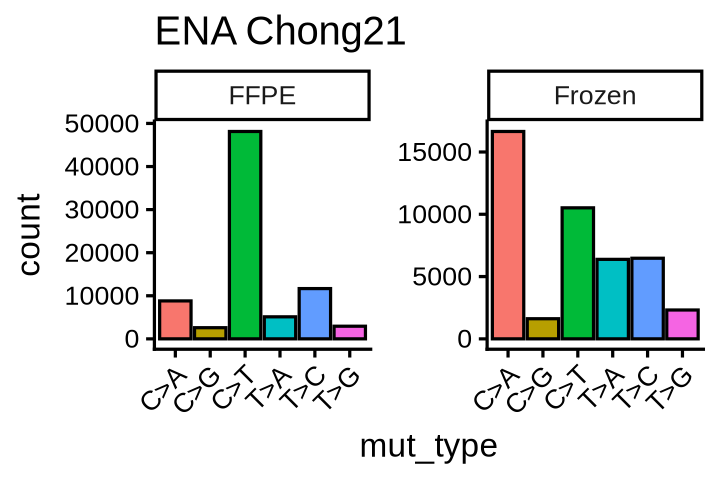

In [19]:
options(repr.plot.width = 6, repr.plot.height = 4)
ggplot(ena_chong21, aes(x=mut_type, fill=mut_type)) +
	geom_bar(color="black") +
	facet_wrap(~preservation, scales="free_y") +
	theme_classic(base_size = 20) +
	theme(
		legend.position = "none",
		axis.text.x = element_text(angle = 45, hjust = 1)
	) + 
	labs(
		title = "ENA Chong21",
		# subtitle = "Distribution of Orientation Bias\nStratified by preservation method and mutation type"
	)

`stat_bin()` using `bins = 30`. Pick better value `binwidth`.
Warning message:
“Removed 995 rows containing non-finite outside the scale range (`stat_bin()`).”


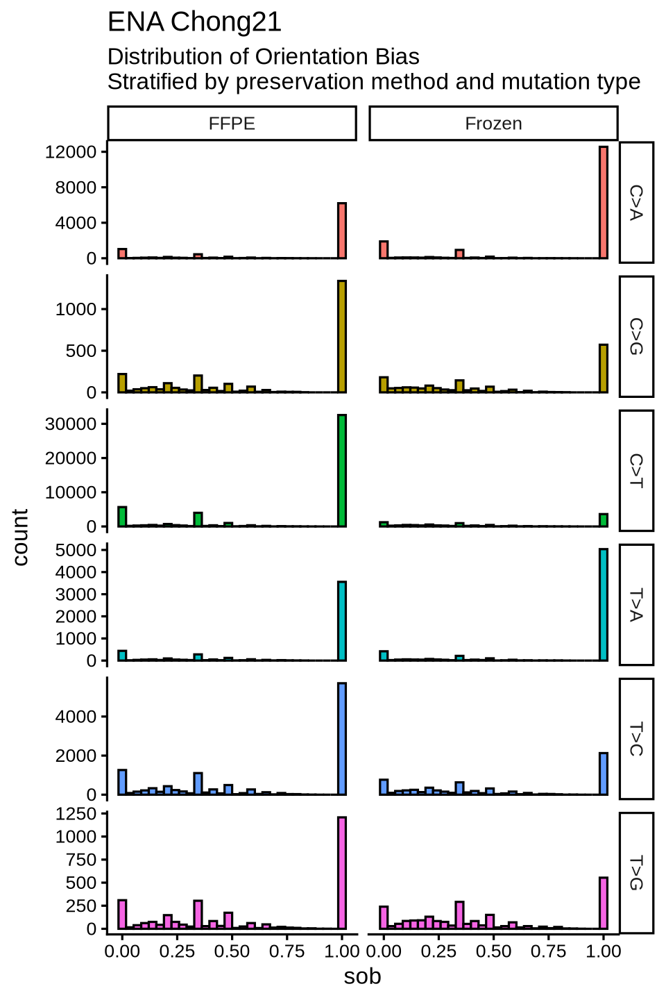

In [20]:
options(repr.plot.width = 8, repr.plot.height = 12)
ggplot(ena_chong21, aes(x=sob, fill=mut_type)) +
	geom_histogram(color="black") +
	facet_grid(mut_type~preservation, scales="free_y") +
	theme_classic(base_size = 20) +
	theme(legend.position = "none") + 
	labs(
		title = "ENA Chong21",
		subtitle = "Distribution of Orientation Bias\nStratified by preservation method and mutation type"
	)

## ENA SRP044740 

In [21]:
vcf_paths = Sys.glob("../../vcf/SRP044740/vcf_filtered_pass-orientation-dp10-blacklist/*/*.vcf")
ena_srp <- list()

for (i in seq_along(vcf_paths)){
	path <- vcf_paths[i]
	sample_name <- basename(dirname(path))
	message(sprintf("%s. Processing sample: %s", i, sample_name))

	vcf <- read_vcf(path, sample_name)
	res <- run_macni(vcf,  sample_name, thresh = 0.5)
	
	ena_srp[[i]] <- res
}

ena_srp <- do.call(rbind, ena_srp)
write_parquet(ena_srp, "ena_SRP044740_macni_ppcut-0.5_table.parquet")


1. Processing sample: BGI-FFPE10_SRR1523246



2. Processing sample: BGI-FFPE10_SRR1523260

3. Processing sample: BGI-FFPE10_SRR1523265

4. Processing sample: BGI-FFPE11_SRR1523250

5. Processing sample: BGI-FFPE11_SRR1523258

6. Processing sample: BGI-FFPE12_SRR1523248

7. Processing sample: BGI-FFPE12_SRR1523259

8. Processing sample: BGI-FFPE13_SRR1523249

9. Processing sample: BGI-FFPE13_SRR1523267

10. Processing sample: BGI-FFPE1_SRR1523243

11. Processing sample: BGI-FFPE1_SRR1523257

12. Processing sample: BGI-FFPE1_SRR1523263

13. Processing sample: BGI-FFPE2_SRR1523244

14. Processing sample: BGI-FFPE2_SRR1523264

15. Processing sample: BGI-FFPE3_SRR1523251

16. Processing sample: BGI-FFPE3_SRR1523269

17. Processing sample: BGI-FFPE4_SRR1523253

18. Processing sample: BGI-FFPE4_SRR1523268

19. Processing sample: BGI-FFPE5_SRR1523252

20. Processing sample: BGI-FFPE5_SRR1523261

21. Processing sample: BGI-FFPE6_SRR1523254

22. Processing sample: BGI-FFPE6_SRR1523256

23. Processing sample: BGI-FFPE7_SRR1523247

24. Proces

In [22]:
thresholds <- seq(0, 1, 0.1)

outdir = "vaf_plots"
dir.create(outdir, showWarnings = FALSE, recursive = TRUE)

for (thresh in thresholds){
	message("Making VAF plots using posterior probability cutoff theshold: ", thresh)

	ena_srp$is_somatic <- ifelse(ena_srp$macni_pp > thresh & !(is.nan(ena_srp$macni_pp) & ena_srp$vaf == 1), TRUE, FALSE)

	make_hist_plot(
		ena_srp,
		title = "ENA Chong21", 
		subtitle = sprintf("MACNI Posterior Probability threshold > %s", thresh),
		file = file.path(outdir, sprintf("ena_SRP044740_macni-%s_per-sample-vaf-plots.pdf", thresh))
	)
}

ena_srp$is_somatic <- ifelse(ena_srp$macni_pp > 0.5 & !(is.nan(ena_srp$macni_pp) & ena_srp$vaf == 1), TRUE, FALSE)

Making VAF plots using posterior probability cutoff theshold: 0



Making VAF plots using posterior probability cutoff theshold: 0.1

Making VAF plots using posterior probability cutoff theshold: 0.2

Making VAF plots using posterior probability cutoff theshold: 0.3

Making VAF plots using posterior probability cutoff theshold: 0.4

Making VAF plots using posterior probability cutoff theshold: 0.5

Making VAF plots using posterior probability cutoff theshold: 0.6

Making VAF plots using posterior probability cutoff theshold: 0.7

Making VAF plots using posterior probability cutoff theshold: 0.8

Making VAF plots using posterior probability cutoff theshold: 0.9

Making VAF plots using posterior probability cutoff theshold: 1



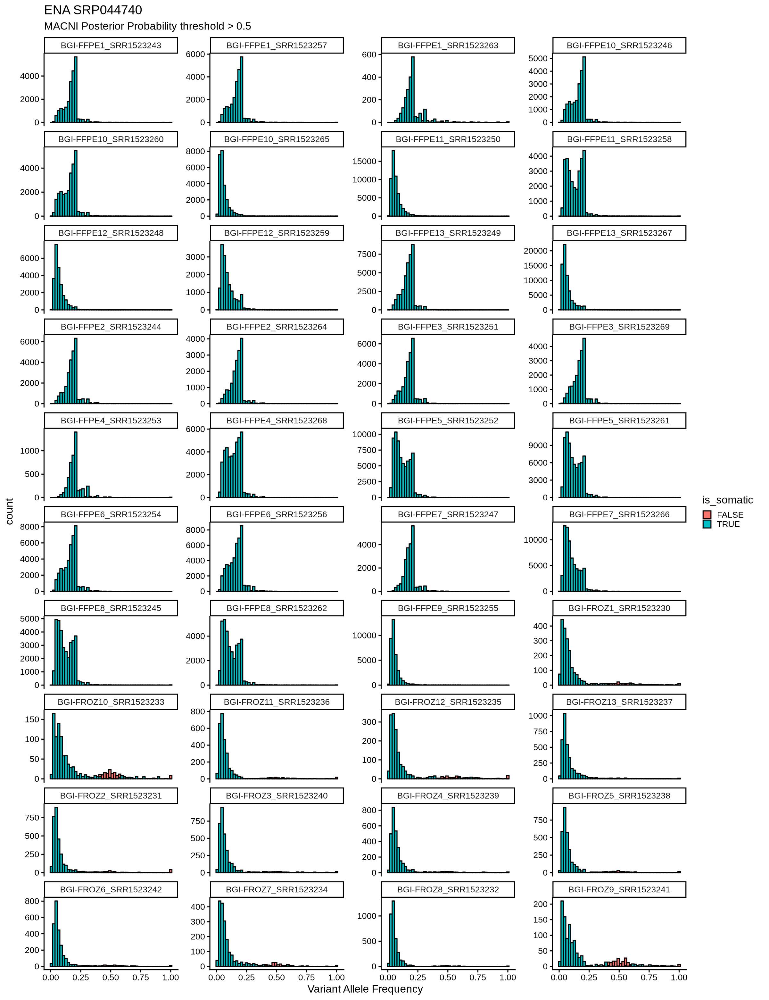

In [23]:
thresh <- 0.5
ena_srp$is_somatic <- ifelse(ena_srp$macni_pp > thresh & !(is.nan(ena_srp$macni_pp) & ena_srp$vaf == 1), TRUE, FALSE)	
make_hist_plot(
	ena_srp, 
	title = "ENA SRP044740", 
	subtitle = sprintf("MACNI Posterior Probability threshold > %s", thresh),
)

Warning message:
“Removed 15164 rows containing non-finite outside the scale range
(`stat_bin()`).”


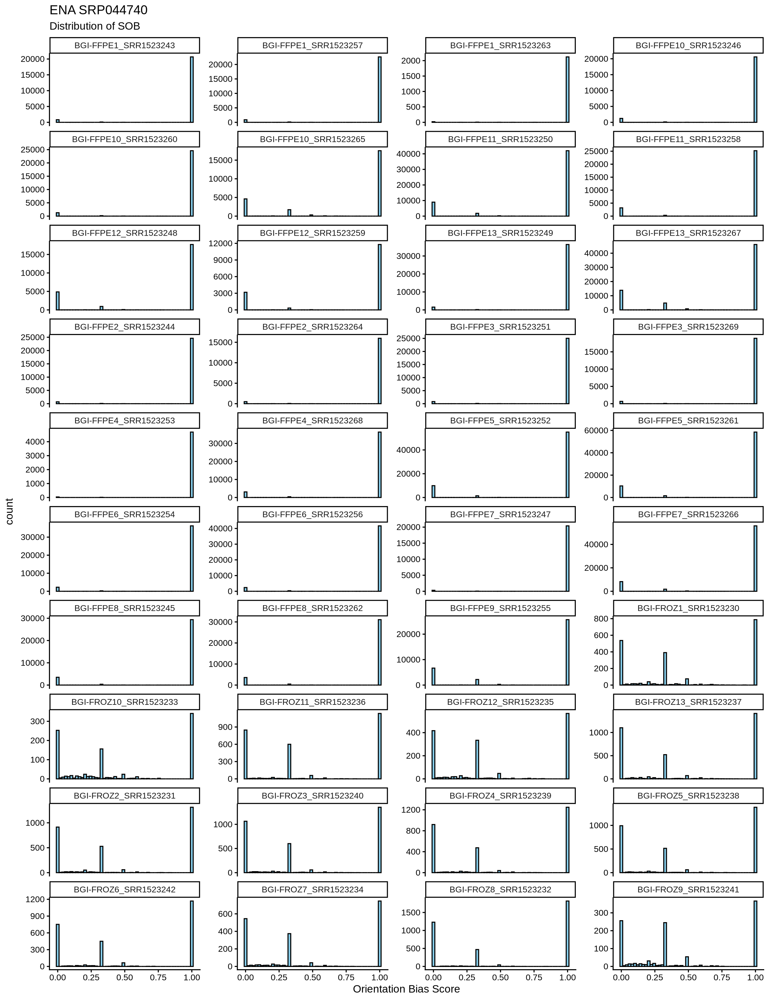

In [24]:
## Distribution of SOB
options(repr.plot.width = 20, repr.plot.height = floor(length(unique(ena_srp$sample_name))/1.5))
ggplot(ena_srp, aes(x=sob)) +
	geom_histogram(color="black", bins = 50, fill="skyblue") +
	facet_wrap(~sample_name, ncol = 4, scales = "free_y") +
	theme_classic(base_size = 20) +
	labs(
		title = "ENA SRP044740",
		subtitle = "Distribution of SOB",
		x =  "Orientation Bias Score"
	)

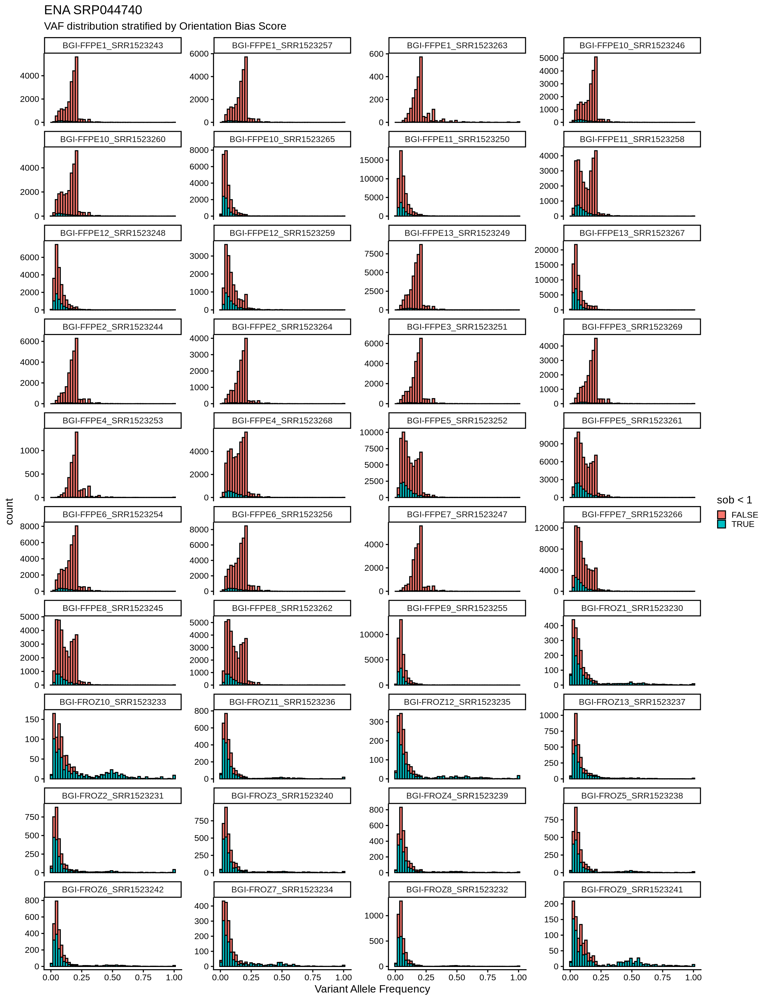

In [25]:
options(repr.plot.width = 20, repr.plot.height = floor(length(unique(ena_srp$sample_name))/1.5))
ggplot(ena_srp[!is.na(ena_srp$sob),], aes(x = vaf, fill = sob<1)) +
	geom_histogram(bins = 50, color="black") +
	theme_classic(base_size = 20) +
	facet_wrap(~sample_name, ncol = 4, scales = "free_y") +
	labs(
		title = "ENA SRP044740",
		subtitle = "VAF distribution stratified by Orientation Bias Score",
		x = "Variant Allele Frequency"
	)

`geom_smooth()` using formula = 'y ~ x'
Warning message:
“Removed 748 rows containing missing values or values outside the scale range
(`geom_smooth()`).”


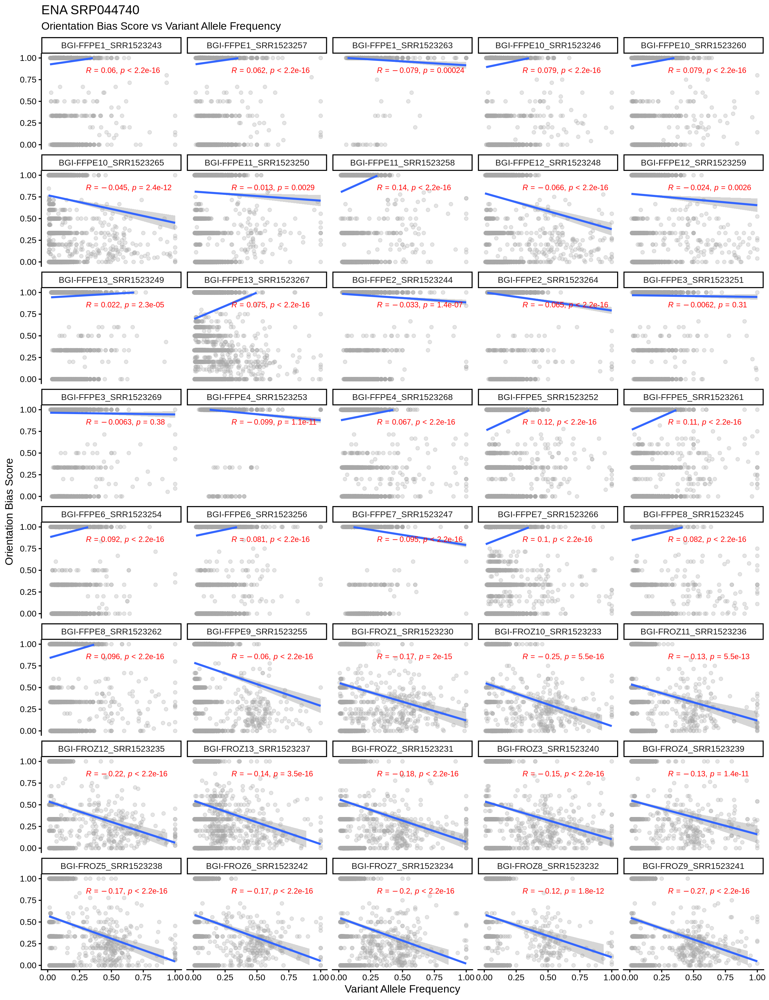

In [26]:
## Relationship between VAF and Orienation Bias Score
ggplot(ena_srp[!is.nan(ena_srp$sob),], aes(x=vaf, y=sob)) +
	geom_point(alpha = 0.3, color="darkgrey") +
	geom_smooth(method = "lm") +
	stat_cor(method = "pearson", label.x = 0.3, label.y = 0.85, size = 5, color = "red", fontface = "bold") +
	facet_wrap(~sample_name, ncol = 5) +
	xlim(0, 1) +
	ylim(0, 1) +
	theme_classic(base_size = 20) +
	labs(
		title = "ENA SRP044740",
		subtitle = "Orientation Bias Score vs Variant Allele Frequency",
		x = "Variant Allele Frequency",
		y = "Orientation Bias Score"
	)

In [27]:
ena_srp <- read_parquet("ena_SRP044740_macni_ppcut-0.5_table.parquet")
ena_srp$preservation <- ifelse(grepl("FFPE", ena_srp$sample_name), "FFPE", "Frozen")
ena_srp <- cannonicalize_mut_type(annotate_mut_type(snv_filter(ena_srp)))

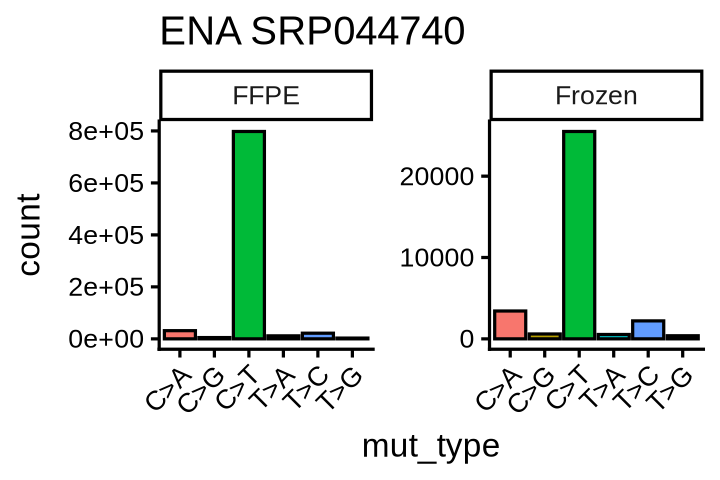

In [28]:
options(repr.plot.width = 6, repr.plot.height = 4)
ggplot(ena_srp, aes(x=mut_type, fill=mut_type)) +
	geom_bar(color="black") +
	facet_wrap(~preservation, scales="free_y") +
	theme_classic(base_size = 20) +
	theme(
		legend.position = "none",
		axis.text.x = element_text(angle = 45, hjust = 1)
	) + 
	labs(
		title = "ENA SRP044740",
		# subtitle = "Distribution of Orientation Bias\nStratified by preservation method and mutation type"
	)

`stat_bin()` using `bins = 30`. Pick better value `binwidth`.
Warning message:
“Removed 13605 rows containing non-finite outside the scale range
(`stat_bin()`).”


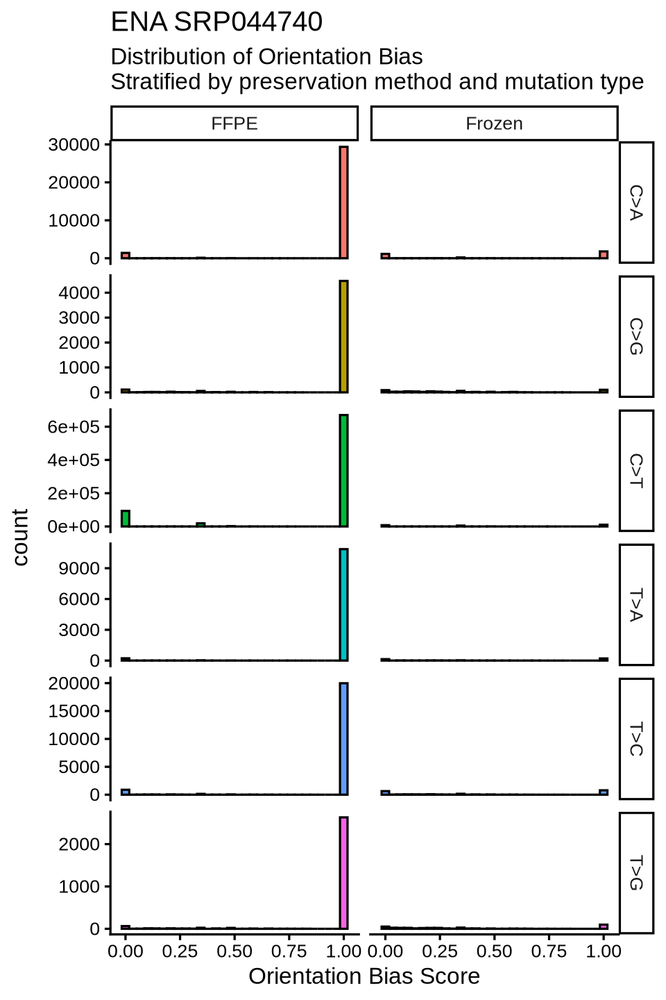

In [29]:
options(repr.plot.width = 8, repr.plot.height = 12)
ggplot(ena_srp, aes(x=sob, fill=mut_type)) +
	geom_histogram(color="black") +
	facet_grid(mut_type~preservation, scales = "free_y") +
	theme_classic(base_size = 20) +
	theme(legend.position = "none") + 
	labs(
		title = "ENA SRP044740",
		subtitle = "Distribution of Orientation Bias\nStratified by preservation method and mutation type",
		x = "Orientation Bias Score"
	)

## Oh15

In [ ]:
vcf_paths = Sys.glob("../../vcf/PRJEB8754/filtered_pass-orient-pos-sb-ad-blacklist_dup-unmarked/*/*.vcf")
ena_oh15 <- list()

for (i in seq_along(vcf_paths)){
	path <- vcf_paths[i]
	sample_name <- basename(dirname(path))
	message(sprintf("%s. Processing sample: %s", i, sample_name))

	res <- run_macni(path,  sample_name, thresh = 0.5)
	
	ena_oh15[[i]] <- res
}

ena_oh15 <- do.call(rbind, ena_oh15)
ena_oh15$preservation <- ifelse(grepl("FFPE", ena_oh15$sample_name), "FFPE", "Frozen")
ena_oh15 <- cannonicalize_mut_type(annotate_mut_type(snv_filter(ena_oh15)))

write_parquet(ena_oh15, file.path("ena_oh15_macni_ppcut-0.5_table.parquet"))

1. Processing sample: Pat01_Meta_FFPE_ERR791893

2. Processing sample: Pat01_Meta_Frozen_ERR791883

3. Processing sample: Pat03_Meta_FFPE_ERR791895

4. Processing sample: Pat03_Meta_Frozen_ERR791884

5. Processing sample: Pat04_Meta_FFPE_ERR791896

6. Processing sample: Pat04_Meta_Frozen_ERR791891

7. Processing sample: Pat08_Meta_FFPE_ERR791901

8. Processing sample: Pat08_Meta_Frozen_ERR791886

9. Processing sample: Pat09_Meta_FFPE_ERR791902

10. Processing sample: Pat09_Meta_Frozen_ERR791887

11. Processing sample: Pat10_Meta_FFPE_ERR791903

12. Processing sample: Pat10_Meta_Frozen_ERR791888

13. Processing sample: Pat11_Meta_FFPE_ERR791905

14. Processing sample: Pat11_Meta_Frozen_ERR791889

15. Processing sample: Pat12_Meta_FFPE_ERR791907

16. Processing sample: Pat12_Meta_Frozen_ERR791911

17. Processing sample: Pat13-2nd-run_Meta_Frozen_ERR791912

18. Processing sample: Pat13_Meta_FFPE_ERR791908

19. Processing sample: Pat13_Meta_Frozen_ERR791890

20. Processing sample: Pat14_Me

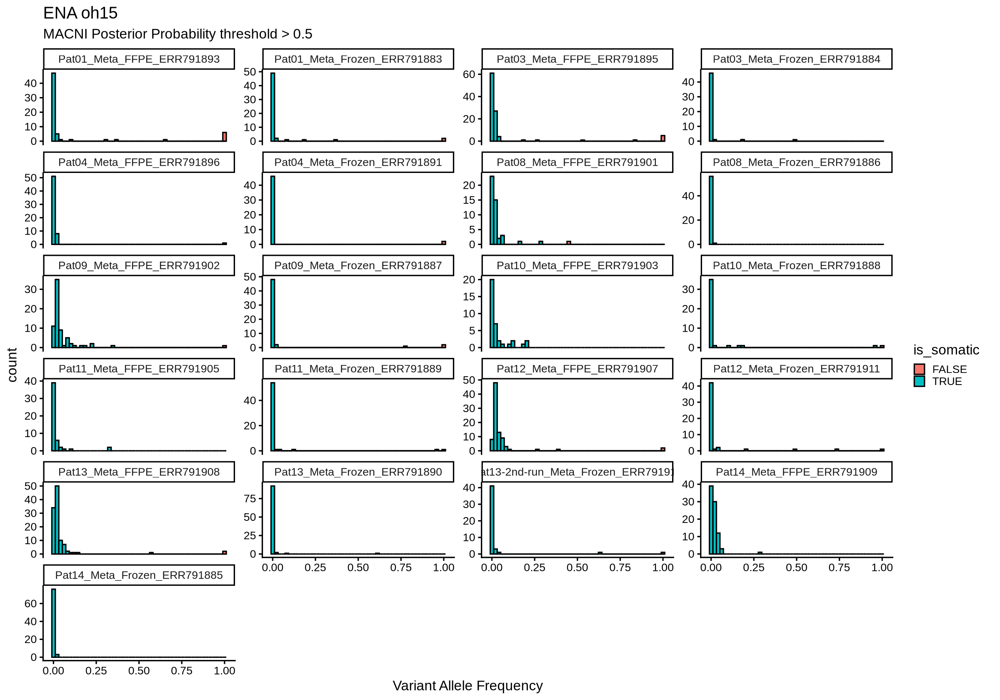

In [12]:
make_hist_plot(
	ena_oh15, 
	title = "ENA oh15", 
	subtitle = sprintf("MACNI Posterior Probability threshold > %s", 0.5),
)

Warning message:
“Removed 89 rows containing non-finite outside the scale range (`stat_bin()`).”


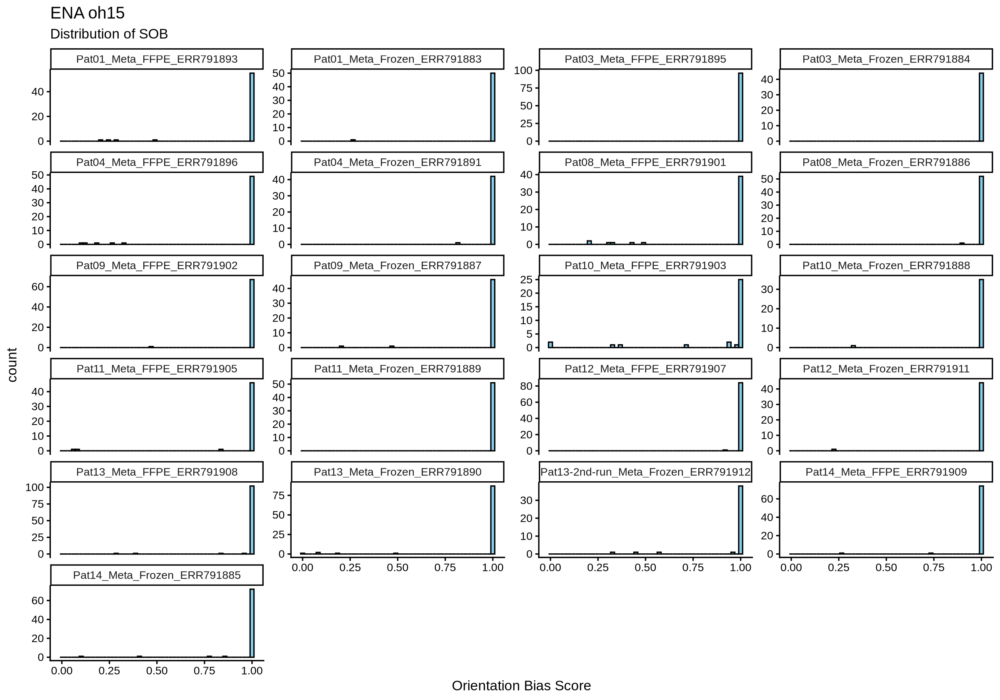

In [13]:
## Distribution of SOB
options(repr.plot.width = 20, repr.plot.height = floor(length(unique(ena_oh15$sample_name))/1.5))
ggplot(ena_oh15, aes(x=sob)) +
	geom_histogram(color="black", bins = 50, fill="skyblue") +
	facet_wrap(~sample_name, ncol = 4, scales = "free_y") +
	theme_classic(base_size = 20) +
	labs(
		title = "ENA oh15",
		subtitle = "Distribution of SOB",
		x =  "Orientation Bias Score"
	)

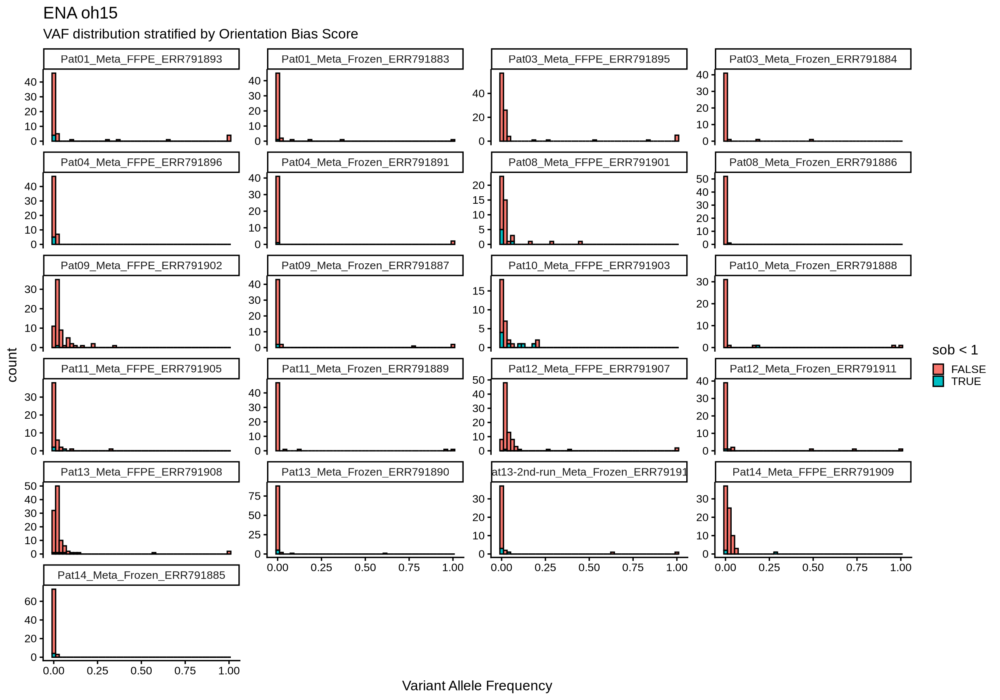

In [14]:
options(repr.plot.width = 20, repr.plot.height = floor(length(unique(ena_oh15$sample_name))/1.5))
ggplot(ena_oh15[!is.na(ena_oh15$sob),], aes(x = vaf, fill = sob<1)) +
	geom_histogram(bins = 50, color="black") +
	theme_classic(base_size = 20) +
	facet_wrap(~sample_name, ncol = 4, scales = "free_y") +
	labs(
		title = "ENA oh15",
		subtitle = "VAF distribution stratified by Orientation Bias Score",
		x = "Variant Allele Frequency"
	)

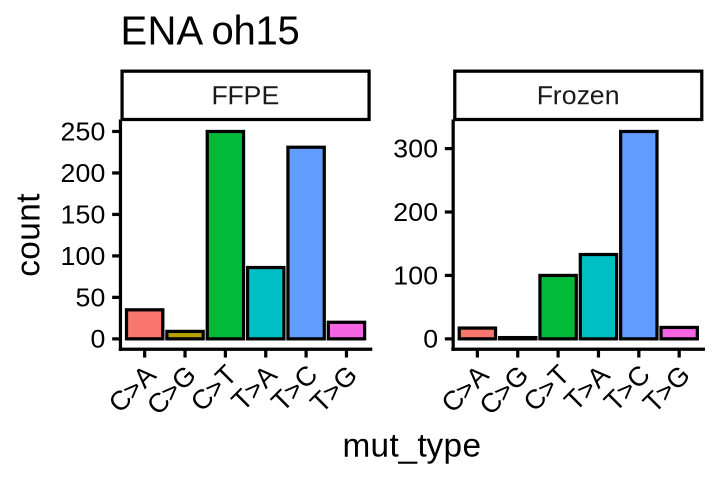

In [19]:
options(repr.plot.width = 6, repr.plot.height = 4)
ggplot(ena_oh15, aes(x=mut_type, fill=mut_type)) +
	geom_bar(color="black") +
	facet_wrap(~preservation, scales="free_y") +
	theme_classic(base_size = 20) +
	theme(
		legend.position = "none",
		axis.text.x = element_text(angle = 45, hjust = 1)
	) + 
	labs(
		title = "ENA oh15",
		# subtitle = "Distribution of Orientation Bias\nStratified by preservation method and mutation type"
	)

`stat_bin()` using `bins = 30`. Pick better value `binwidth`.
Warning message:
“Removed 67 rows containing non-finite outside the scale range (`stat_bin()`).”


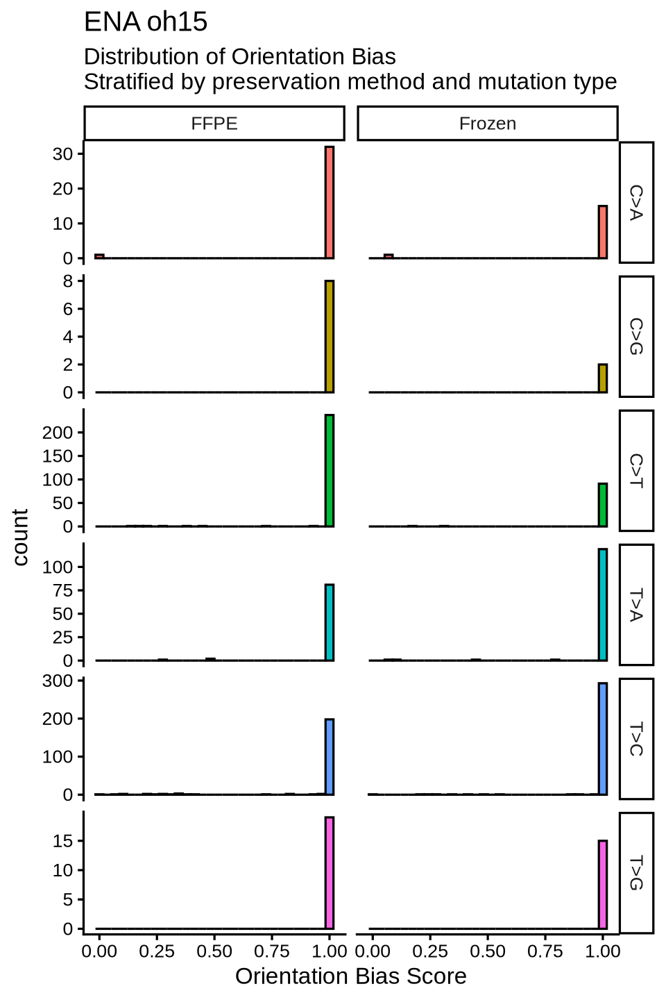

In [20]:
options(repr.plot.width = 8, repr.plot.height = 12)
ggplot(ena_oh15, aes(x=sob, fill=mut_type)) +
	geom_histogram(color="black") +
	facet_grid(mut_type~preservation, scales = "free_y") +
	theme_classic(base_size = 20) +
	theme(legend.position = "none") + 
	labs(
		title = "ENA oh15",
		subtitle = "Distribution of Orientation Bias\nStratified by preservation method and mutation type",
		x = "Orientation Bias Score"
	)

## Individual Samples analysis

In [30]:
vcf1 <- read_vcf("../../vcf/SRP044740/vcf_filtered_pass-orientation-dp10-blacklist/BGI-FFPE13_SRR1523249/BGI-FFPE13_SRR1523249.vcf", "BGI-FFPE13_SRR1523249")
macni_res <- run_macni(vcf1, "BGI-FFPE13_SRR1523249")

In [31]:
table(macni_res[, c("filter", "sob")])

             sob
filter            0 0.142857142857143   0.2  0.25 0.333333333333333
  orientation     0                 0     0     0                 0
  PASS         1554                 1     6     1               169
             sob
filter        0.428571428571429   0.5   0.6     1
  orientation                 0     0     0  1755
  PASS                        1    16     7 34635

In [32]:
table(macni_res[is.nan(macni_res$sob), ]$filter)


orientation        PASS 
         45         436 

Warning message:
“Removed 481 rows containing non-finite outside the scale range (`stat_bin()`).”


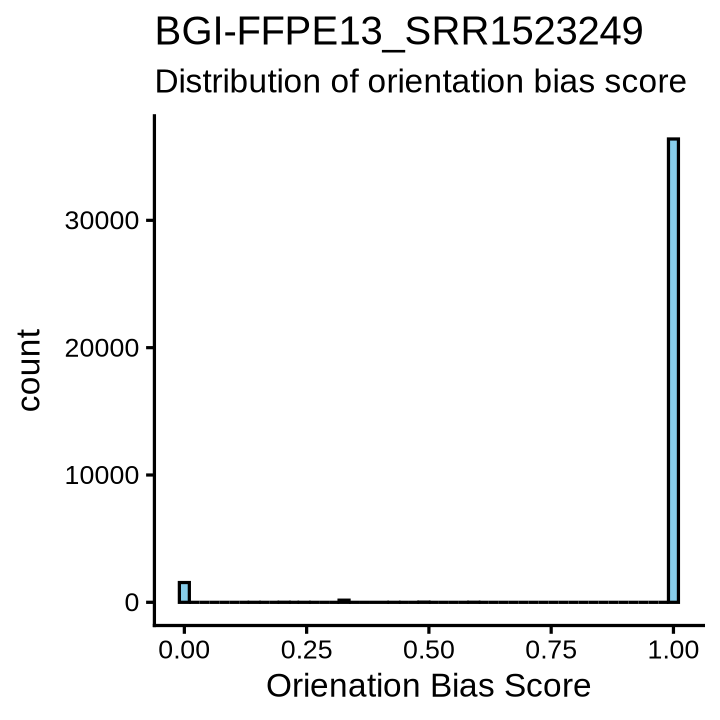

In [33]:
options(repr.plot.width = 6, repr.plot.height = 6)
ggplot(macni_res, aes(x = .data[["sob"]])) +
	geom_histogram(bins = 50, color="black", fill="skyblue") +
	# geom_density(aes(y = after_stat(count)), alpha=0.3) +
	theme_classic(base_size = 20) +
	labs(
		title = "BGI-FFPE13_SRR1523249",
		subtitle = "Distribution of orientation bias score",
		x = "Orienation Bias Score"
	)

Warning message:
“Removed 481 rows containing missing values or values outside the scale range
(`geom_point()`).”


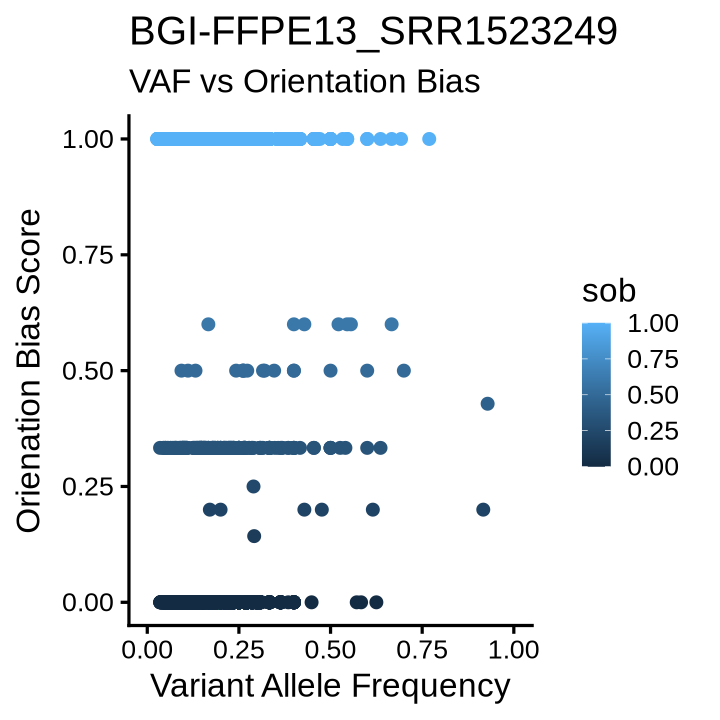

In [34]:
ggplot(macni_res, aes(x = .data[["vaf"]], y = .data[["sob"]], color = .data[["sob"]])) +
	# geom_histogram(bins = 50, color="black", fill="lightblue") +
	geom_point() +
	# facet_wrap(~sob<sob_thresh, ncol = 4, scales = "free_y") + 
	theme_classic(base_size = 20) +
	xlim(0, 1) +
	labs(
		title = "BGI-FFPE13_SRR1523249",
		subtitle = "VAF vs Orientation Bias",
		y = "Orienation Bias Score",
		x = "Variant Allele Frequency"
	)

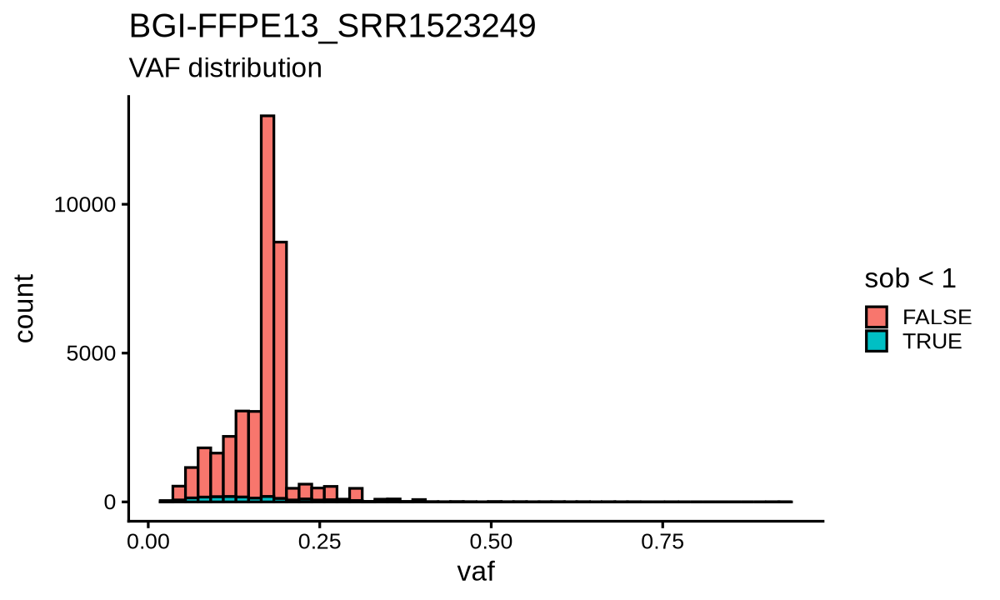

In [35]:
options(repr.plot.width = 10, repr.plot.height = 6)
ggplot(na.omit(macni_res), aes(x = vaf, fill = sob<1)) +
	geom_histogram(bins = 50, color="black") +
	theme_classic(base_size = 20) +
	labs(
		title = "BGI-FFPE13_SRR1523249",
		subtitle = "VAF distribution",
	)

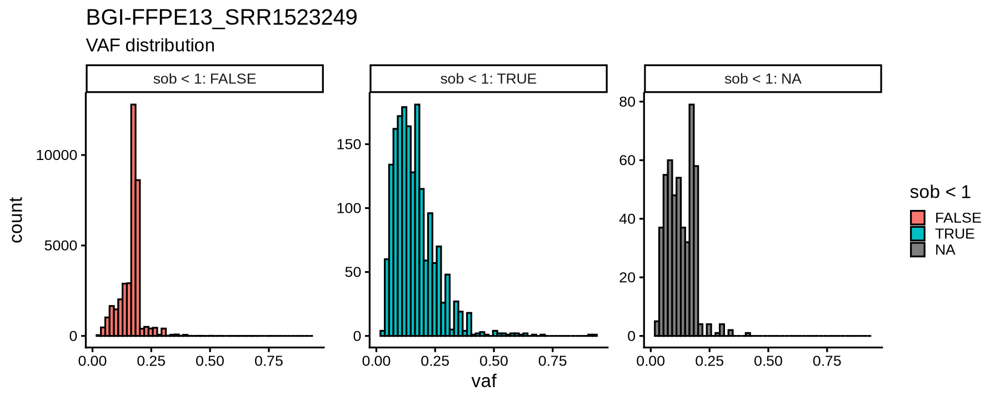

In [36]:
options(repr.plot.width = 15, repr.plot.height = 6)
ggplot(macni_res, aes(x = vaf, fill = sob<1)) +
	geom_histogram(bins = 50, color="black") +
	theme_classic(base_size = 20) +
	facet_wrap(~sob<1, scales = "free_y", labeller = label_both) +
	labs(
		title = "BGI-FFPE13_SRR1523249",
		subtitle = "VAF distribution",
	)

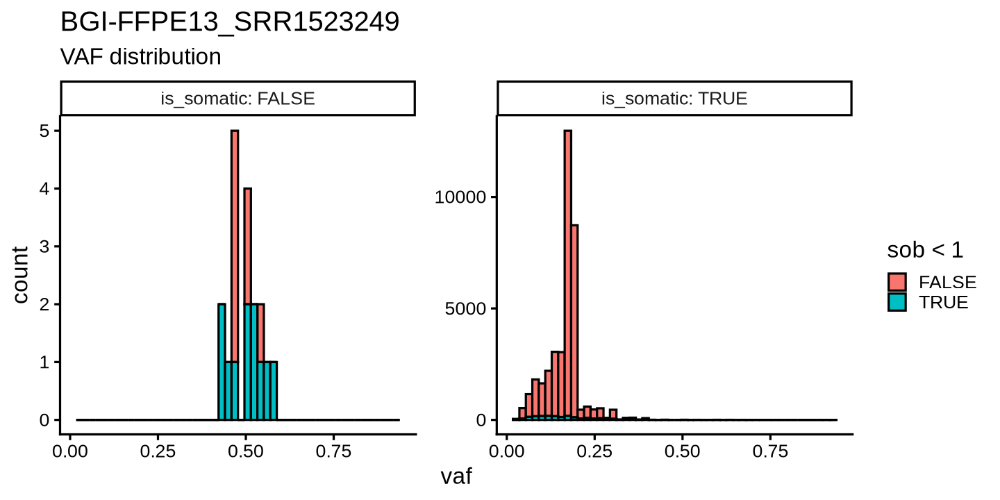

In [37]:
options(repr.plot.width = 12, repr.plot.height = 6)
ggplot(na.omit(macni_res), aes(x = vaf, fill = sob<1)) +
	geom_histogram(bins = 50, color="black") +
	theme_classic(base_size = 20) +
	facet_wrap(~is_somatic, scales = "free_y", labeller = label_both) +
	labs(
		title = "BGI-FFPE13_SRR1523249",
		subtitle = "VAF distribution",
	)

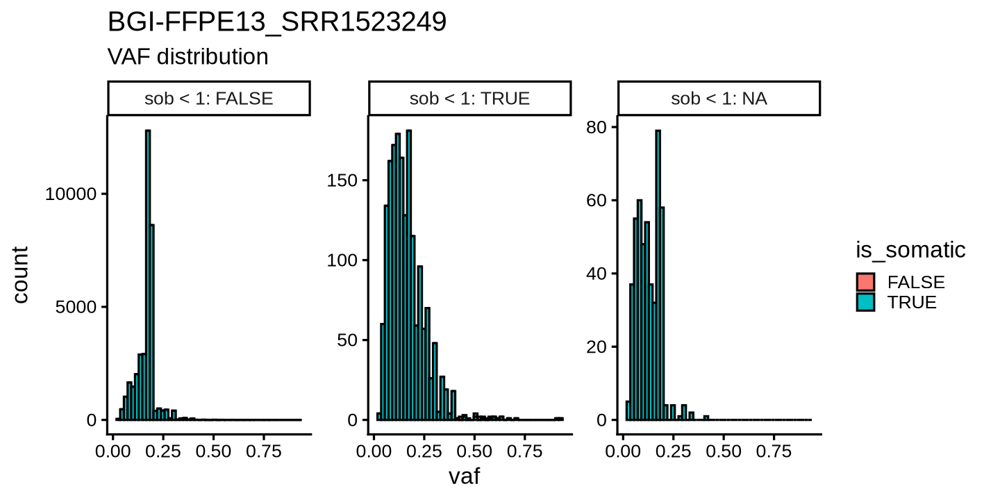

In [38]:
options(repr.plot.width = 12, repr.plot.height = 6)
ggplot(macni_res, aes(x = vaf, fill = is_somatic)) +
	geom_histogram(bins = 50, color="black") +
	theme_classic(base_size = 20) +
	facet_wrap(~sob<1, scales = "free_y", labeller = label_both) +
	labs(
		title = "BGI-FFPE13_SRR1523249",
		subtitle = "VAF distribution",
	)

In [39]:
high_sob <- macni_res[with(macni_res, sob == 1),]